## Count table filtering and UMAP generation
Here I filter the count tables of the different donors and generate UMAPs which can be exported in order to analyse the single cell RNA seq data. The merged dataset includes the following datasets: SMART-seq (Wang et al., GSE83139; and Xin et al., GSE81608) and SMART-seq2 (Enge et al. GSE81547; and Segerstolpe et al. E-MTAB-5061).

In [1]:
import sys, os
import pandas as pd
import numpy as np
from pandas.io.parsers import read_csv
import matplotlib.pyplot as plt
import glob
import scanpy as sc
import scrublet as scr
import bbknn
%matplotlib inline

# Import count_matrix
the count matrices are generated by counting of the reads falling in an artificial 3'UTR. Moreover mitochondrial genes were also counted. I removed the INS-IGF2 gene from the GTF file to make it able to include the INS gene in our analysis.

In [2]:
files = glob.glob('../count_tables/*.tsv') # count matrices
threshold_vals = '../count_tables/filter_criteria_3utrcount.csv' # filtering criteria
thv = read_csv(threshold_vals, sep=';', index_col=0)

In [3]:
# list of donor names from count matrix files
donors=[i.rsplit('igf2/')[1].rsplit('_count-matrix')[0] for i in files]
donors

['SER_HP1508501T2D',
 'XIN16_donorH9',
 'XIN16_donorT3',
 'XIN16_donorH2',
 'XIN16_donorH6',
 'XIN16_donorH11',
 'WAN_DonorHP-15095-fresh',
 'SER_HP1504101T2D',
 'XIN16_donorH8',
 'WAN_DonorACAP236',
 'ENG_DonorM22',
 'XIN16_donorH3',
 'WAN_DonorHP-15041',
 'XIN16_donorT2',
 'WAN_DonorAAJF112',
 'ENG_DonorF38',
 'SER_AZ',
 'XIN16_donorH10',
 'XIN16_donorT6',
 'XIN16_donorH7',
 'ENG_DonorM21',
 'XIN16_donorT1',
 'SER_HP1504901',
 'SER_HP1506401',
 'WAN_DonorABAF490',
 'ENG_DonorM54',
 'SER_HP1525301T2D',
 'SER_HP1526901T2D',
 'SER_HP1502401',
 'SER_HP1509101',
 'XIN16_donorH4',
 'XIN16_donorT5',
 'XIN16_donorH1',
 'SER_HP1507101',
 'XIN16_donorT4',
 'ENG_DonorF44']

In [4]:
# number of donors in this analysis
len(donors)

36

# Filter count matrix

In [5]:
# Dictionary with unfiltered count tables
donor_matrices = dict()
for i in range(len(files)):
    donor_matrices[donors[i]] = read_csv(files[i], sep='\t', index_col=0)

In [6]:
# table with filtering criteria 
thv

,min_reads,mito_frac
Donor,,
BAR_Donor1H,30000,0.2
BAR_Donor2H,30000,0.3
BAR_Donor3H,30000,0.2
BAR_Donor4T,10000,0.2
MUR_Donor28,1000,0.4
MUR_Donor29,1000,0.4
MUR_Donor30,1000,0.4
MUR_Donor31,1000,0.4
SER_AZ,10000,0.2


In [7]:
# dictionary with metadata, needed for selection
meta_dict = dict()
for key in donors:
    mito = [idx for idx in donor_matrices[key].index if 'MT-' in idx]
    matrix = donor_matrices[key].loc[mito]
    meta_dict[key] = pd.DataFrame({'reads': donor_matrices[key].sum(), 'genes': (donor_matrices[key]>0).sum()})
    meta_dict[key]['mito'] = matrix.loc[mito].sum()
    meta_dict[key]['GAPDH'] = donor_matrices[key].loc['GAPDH>12']
    meta_dict[key]['GAPDH_frac'] = meta_dict[key]['GAPDH'] /meta_dict[key]['reads']
    meta_dict[key]['mito_frac'] = meta_dict[key]['mito']/meta_dict[key]['reads']

In [8]:
# meta data df check
meta_dict['ENG_DonorF44']

,reads,genes,mito,GAPDH,GAPDH_frac,mito_frac
ENG_DonorF44_Cell_1,278984,2999,52776,260,0.000932,0.189172
ENG_DonorF44_Cell_10,166390,1591,77123,102,0.000613,0.463507
ENG_DonorF44_Cell_100,484998,3346,66761,622,0.001282,0.137652
ENG_DonorF44_Cell_101,839096,4067,101772,706,0.000841,0.121288
ENG_DonorF44_Cell_102,362748,3062,65306,491,0.001354,0.180031
...,...,...,...,...,...,...
ENG_DonorF44_Cell_95,256534,2819,47758,381,0.001485,0.186166
ENG_DonorF44_Cell_96,153430,3548,49617,181,0.001180,0.323385
ENG_DonorF44_Cell_97,309475,1919,46387,826,0.002669,0.149889
ENG_DonorF44_Cell_98,601202,3335,76355,430,0.000715,0.127004


dictionary with filtered metadata, based on values of thv table
1. filter on minimal amount of reads
2. filter on maximum of mitochondrial gene fraction
3. filter cells with more than 200 genes

In [8]:
mingenes=200
#min_gapdh = 1e-4

filtered_meta_dict = dict()
for key in donors:
    #filtered_meta_dict[key] = meta_dict[key][(meta_dict[key]['reads']> thv.loc[key,'min_reads']) & (meta_dict[key]['mito_frac']<=thv.loc[key,'mito_frac']) & (meta_dict[key]['genes']> mingenes) & (meta_dict[key]['GAPDH_frac'] >= min_gapdh)]
    filtered_meta_dict[key] = meta_dict[key][(meta_dict[key]['reads']> thv.loc[key,'min_reads']) & (meta_dict[key]['mito_frac']<=thv.loc[key,'mito_frac']) & (meta_dict[key]['genes']> mingenes)]
    
    

In [9]:
# merge meteadata into one
merged_meta = pd.concat((meta_dict[key] for key in donors), axis=0, join='outer').fillna(0)
merged_meta.shape

(7019, 6)

In [11]:
filtered_meta_dict

{'SER_HP1508501T2D':                        reads  genes    mito  GAPDH  GAPDH_frac  mito_frac
 SER_HP1508501T2D_A10   33419   3285    9240     59    0.001765   0.276489
 SER_HP1508501T2D_A11  135695   4946   24298    338    0.002491   0.179063
 SER_HP1508501T2D_A12  343571   5948   66324    407    0.001185   0.193043
 SER_HP1508501T2D_A13  266204   3975   53534    342    0.001285   0.201101
 SER_HP1508501T2D_A14  199193   4815   40640     95    0.000477   0.204023
 ...                      ...    ...     ...    ...         ...        ...
 SER_HP1508501T2D_P5    12850   3442    2737     18    0.001401   0.212996
 SER_HP1508501T2D_P6    41236   4429   10712     37    0.000897   0.259773
 SER_HP1508501T2D_P7   209771   6931   39089    204    0.000972   0.186341
 SER_HP1508501T2D_P8   785882   6994  138719    844    0.001074   0.176514
 SER_HP1508501T2D_P9    23184   4444    4752     21    0.000906   0.204969
 
 [271 rows x 6 columns],
 'XIN16_donorH9':                         reads  gene

In [10]:
# merge filtered_metadata into one
merged_Fmeta = pd.concat((filtered_meta_dict[key] for key in donors), axis=0, join='outer').fillna(0)
merged_Fmeta.shape

(3547, 6)

(0.0, 1.0)

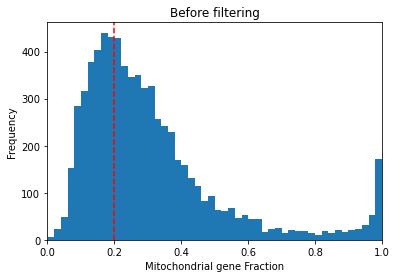

In [12]:
# plot mito fraction for all donors
plt.subplots()
plt.hist(merged_meta['mito_frac'], bins = 50)
plt.axvline(x=0.2, color='red', linestyle='--')
plt.title(str("Before filtering"))
plt.xlabel('Mitochondrial gene Fraction')
plt.ylabel('Frequency')
plt.xlim([0,1])

(0.0, 1.0)

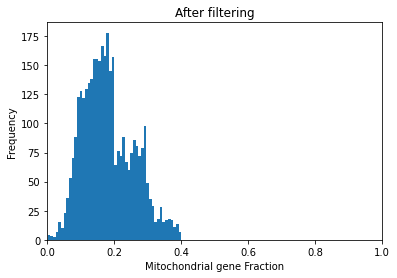

In [13]:
plt.subplots()
plt.hist(merged_Fmeta['mito_frac'], bins = 50)
plt.title(str("After filtering"))
plt.xlabel('Mitochondrial gene Fraction')
plt.ylabel('Frequency')
plt.xlim([0,1])

(0.0, 0.006)

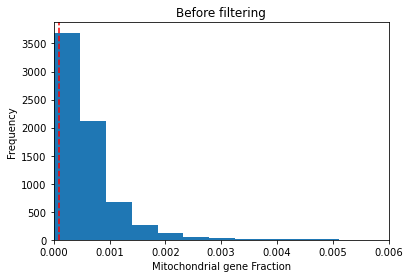

In [14]:
plt.subplots()
plt.hist(merged_meta['GAPDH_frac'], bins = 50)
plt.axvline(x=1e-4, color='red', linestyle='--')
plt.title(str("Before filtering"))
plt.xlabel('Mitochondrial gene Fraction')
plt.ylabel('Frequency')
plt.xlim([0,0.006])

Text(0, 0.5, 'Frequency')

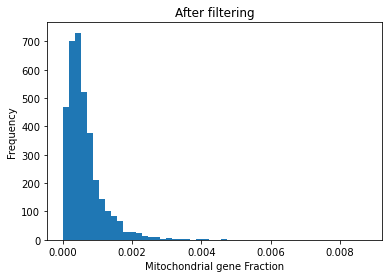

In [15]:
plt.subplots()
plt.hist(merged_Fmeta['GAPDH_frac'], bins = 50)
plt.title(str("After filtering"))
plt.xlabel('Mitochondrial gene Fraction')
plt.ylabel('Frequency')
#plt.xlim([0,1])

In [16]:
# Dictionaries of filtered count tables
filtered_matrices = dict()
for key in donors:
    index_list = filtered_meta_dict[key].index
    filtered_matrices[key] = donor_matrices[key].loc[:,index_list]

In [17]:
filtered_matrices

{'SER_HP1508501T2D':             SER_HP1508501T2D_A10  SER_HP1508501T2D_A11  SER_HP1508501T2D_A12  \
 Geneid>Chr                                                                     
 TMEM130>7                      4                     0                     0   
 PLCD1>3                        0                     1                     0   
 ZNF654>3                       0                     0                     1   
 ISCA1>9                        5                    13                    11   
 PACS2>14                       0                    14                     4   
 ...                          ...                   ...                   ...   
 MT-ND6>MT                     72                   145                   903   
 MT-TE>MT                       0                     0                     2   
 MT-CYB>MT                    946                  3107                  5568   
 MT-TT>MT                       0                     3                     2   
 MT-TP>M

In [18]:
# Table with number of cells before and after filtering 
filtering_df = pd.DataFrame({'donor': [key for key in donors], 'Ncells_before': [len(donor_matrices[str(key)].columns) for key in donor_matrices]})
filtering_df['Ncells_after'] = [len(filtered_meta_dict[key].index) for key in donors]
filtering_df['Ncells_removed'] = filtering_df['Ncells_before'] - filtering_df['Ncells_after']

filtering_df.sort_values(by=['donor'])



,donor,Ncells_before,Ncells_after,Ncells_removed
15,ENG_DonorF38,474,227,247
35,ENG_DonorF44,277,129,148
20,ENG_DonorM21,505,335,170
10,ENG_DonorM22,286,76,210
25,ENG_DonorM54,272,217,55
16,SER_AZ,96,56,40
28,SER_HP1502401,301,141,160
7,SER_HP1504101T2D,358,150,208
22,SER_HP1504901,383,134,249
23,SER_HP1506401,383,121,262


In [19]:
# merge count tables into one
matrix = pd.concat((filtered_matrices[key] for key in donors), axis=1, join='outer').fillna(0)
matrix.shape

(19580, 3547)

In [23]:
file_name = '../count_tables/SmartseqPancreas_filtered_count_matrix.csv'
matrix.to_csv(file_name, sep=',')

In [20]:
matrix_unfiltered = pd.concat((donor_matrices[key] for key in donors), axis=1, join='outer').fillna(0)
matrix_unfiltered.shape

(19580, 7019)

In [21]:
matrix_unfiltered

,SER_HP1508501T2D_A1,SER_HP1508501T2D_A10,SER_HP1508501T2D_A11,SER_HP1508501T2D_A12,SER_HP1508501T2D_A13,SER_HP1508501T2D_A14,SER_HP1508501T2D_A15,SER_HP1508501T2D_A16,SER_HP1508501T2D_A17,SER_HP1508501T2D_A18,...,ENG_DonorF44_Cell_90,ENG_DonorF44_Cell_91,ENG_DonorF44_Cell_92,ENG_DonorF44_Cell_93,ENG_DonorF44_Cell_94,ENG_DonorF44_Cell_95,ENG_DonorF44_Cell_96,ENG_DonorF44_Cell_97,ENG_DonorF44_Cell_98,ENG_DonorF44_Cell_99
Geneid>Chr,,,,,,,,,,,,,,,,,,,,,
TMEM130>7,0,4,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PLCD1>3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ZNF654>3,0,0,0,1,28,0,0,2,0,0,...,0,0,0,0,0,0,0,0,0,76
ISCA1>9,0,5,13,11,35,14,0,0,39,0,...,0,9,185,0,0,0,24,0,43,25
PACS2>14,0,0,14,4,1,3,0,0,24,0,...,0,0,0,0,0,0,2,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-ND6>MT,2,72,145,903,615,768,483,26,718,0,...,391,668,470,701,197,241,220,142,714,235
MT-TE>MT,0,0,0,2,7,1,0,0,2,0,...,0,0,0,0,0,0,0,0,0,0
MT-CYB>MT,13,946,3107,5568,4158,5098,1564,320,9730,14,...,5640,4398,6846,7088,5893,5935,5805,851,12337,4643


Text(0.5, 1.0, 'After filtering')

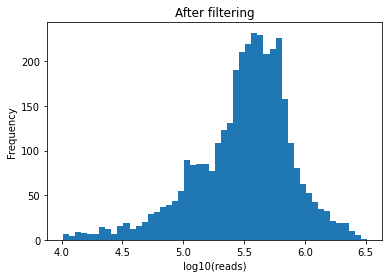

In [22]:
# Number of reads per cell
plt.hist(np.log10(matrix.sum()), bins = 50)
plt.xlabel('log10(reads)')
plt.ylabel('Frequency')
plt.title('After filtering')


Text(0.5, 1.0, 'Before filtering')

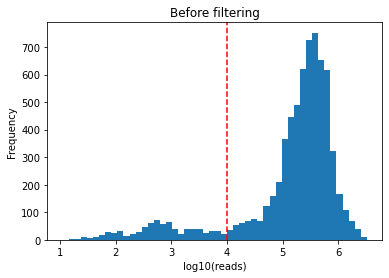

In [25]:
plt.hist(np.log10(matrix_unfiltered.sum()+1), bins = 50)
plt.axvline(x=4.0, color='red', linestyle='--')
plt.xlabel('log10(reads)')
plt.ylabel('Frequency')
plt.title('Before filtering')

# Scanpy sc-RNA-seq analyis

In [26]:
adata = sc.AnnData(matrix.transpose())

In [28]:
# append age bin to metadata file
meta = '../count_tables/3UTRpancreas_donor_metadata.csv'
metadata = pd.read_csv(meta, sep=";", index_col=0)
# age bins
young = 30
middle = 50

metadata['age_bin'] = ['Unknown' if metadata['age'][i] == 0  else 'Young' if metadata['age'][i] <=young else 'Middle_aged' if metadata['age'][i] <= middle else 'Old' for i in metadata.index]
metadata

,donor_ID,dataset,age,group,gender,BMI,ncells,age_bin
dataset_donor_ID,,,,,,,,
XIN16_donorH1,donorH1,XIN16,23,healthy,male,NaN,NaN,Young
XIN16_donorH2,donorH2,XIN16,32,healthy,female,NaN,NaN,Middle_aged
XIN16_donorH3,donorH3,XIN16,23,healthy,female,NaN,NaN,Young
XIN16_donorH4,donorH4,XIN16,56,healthy,female,NaN,NaN,Old
XIN16_donorH5,donorH5,XIN16,27,healthy,male,NaN,NaN,Young
XIN16_donorH6,donorH6,XIN16,68,healthy,male,NaN,NaN,Old
XIN16_donorH7,donorH7,XIN16,29,healthy,male,NaN,NaN,Young
XIN16_donorH8,donorH8,XIN16,60,healthy,male,NaN,NaN,Old
XIN16_donorH9,donorH9,XIN16,24,healthy,female,NaN,NaN,Young


In [29]:
adata.obs

""
SER_HP1508501T2D_A10
SER_HP1508501T2D_A11
SER_HP1508501T2D_A12
SER_HP1508501T2D_A13
SER_HP1508501T2D_A14
...
ENG_DonorF44_Cell_93
ENG_DonorF44_Cell_94
ENG_DonorF44_Cell_95
ENG_DonorF44_Cell_97


In [30]:
# Append metadata to the adata 
adata.obs['Donor'] = [str(i.rsplit('_')[0]+"_"+i.rsplit('_')[1]) for i in adata.obs.index]
adata.obs['Dataset'] = [str(i.rsplit('_')[0]) for i in adata.obs.index]
adata.obs['Group'] = [metadata['group'][i] for i in adata.obs['Donor']]
adata.obs['Gender'] = ['Male' if metadata['gender'][i] in 'male' else 'Female' for i in adata.obs['Donor']]
adata.obs['Age'] = [metadata['age'][i] for i in adata.obs['Donor']]
adata.obs['Age_bin'] = [metadata['age_bin'][i] for i in adata.obs['Donor']]
adata.obs['BMI'] = [metadata['BMI'][i] for i in adata.obs['Donor']]
adata.obs

,Donor,Dataset,Group,Gender,Age,Age_bin,BMI
SER_HP1508501T2D_A10,SER_HP1508501T2D,SER,T2D,Female,37,Middle_aged,"39,6"
SER_HP1508501T2D_A11,SER_HP1508501T2D,SER,T2D,Female,37,Middle_aged,"39,6"
SER_HP1508501T2D_A12,SER_HP1508501T2D,SER,T2D,Female,37,Middle_aged,"39,6"
SER_HP1508501T2D_A13,SER_HP1508501T2D,SER,T2D,Female,37,Middle_aged,"39,6"
SER_HP1508501T2D_A14,SER_HP1508501T2D,SER,T2D,Female,37,Middle_aged,"39,6"
...,...,...,...,...,...,...,...
ENG_DonorF44_Cell_93,ENG_DonorF44,ENG,healthy,Female,44,Middle_aged,NaN
ENG_DonorF44_Cell_94,ENG_DonorF44,ENG,healthy,Female,44,Middle_aged,NaN
ENG_DonorF44_Cell_95,ENG_DonorF44,ENG,healthy,Female,44,Middle_aged,NaN
ENG_DonorF44_Cell_97,ENG_DonorF44,ENG,healthy,Female,44,Middle_aged,NaN


In [31]:
adata.var

""
Geneid>Chr
TMEM130>7
PLCD1>3
ZNF654>3
ISCA1>9
PACS2>14
...
MT-ND6>MT
MT-TE>MT
MT-CYB>MT


In [32]:
# Remove chromosome from gene name and add to own column
genes_chr = adata.var.index
adata.var['Chr'] = [i.rsplit('>')[1] for i in genes_chr]
adata.var.index = [i.rsplit('>')[0] for i in genes_chr]

In [33]:
# Add biotype to gene
btype='../supportfiles/gff2_gene-name_biotype.txt'
biotype = pd.read_csv(btype, sep=";", names=['gene', 'biotype'], index_col=0)
adata.var['Biotype'] = [biotype['biotype'][i] for i in adata.var.index]

In [34]:
adata.var

,Chr,Biotype
TMEM130,7,protein_coding
PLCD1,3,protein_coding
ZNF654,3,protein_coding
ISCA1,9,protein_coding
PACS2,14,protein_coding
...,...,...
MT-ND6,MT,protein_coding
MT-TE,MT,Mt_tRNA
MT-CYB,MT,protein_coding
MT-TT,MT,Mt_tRNA


# Analyzing the datasets

In [35]:
#  Setting the parameters for Scanpy (a library for the analysis of sc RNA seq datasets)

sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=200, facecolor='white')

scanpy==1.7.1 anndata==0.7.5 umap==0.5.1 numpy==1.19.2 scipy==1.5.2 pandas==1.1.3 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.9.0 leidenalg==0.8.3


normalizing counts per cell
    finished (0:00:00)


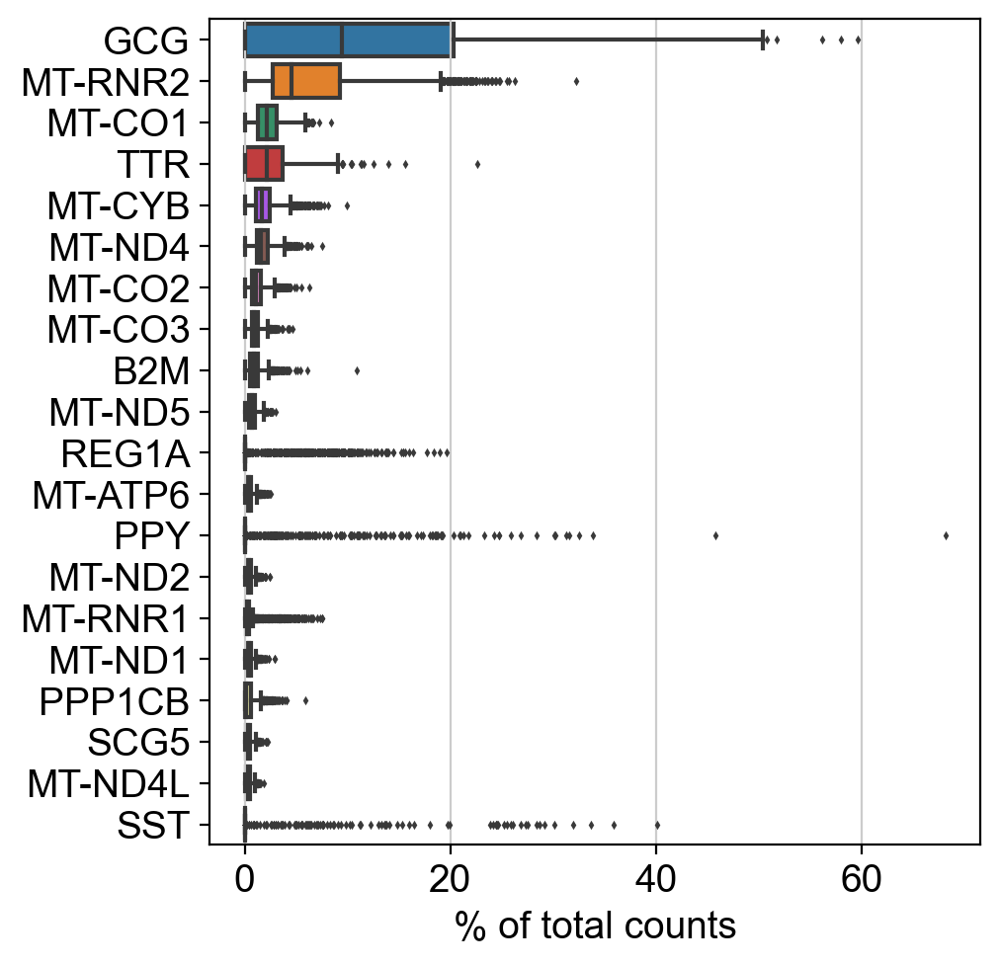

In [36]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [37]:
# Remove genes that are present in less than 3 cells
sc.pp.filter_genes(adata, min_cells=3)

filtered out 2988 genes that are detected in less than 3 cells


In [38]:
adata.var

,Chr,Biotype,n_cells
TMEM130,7,protein_coding,309
PLCD1,3,protein_coding,297
ZNF654,3,protein_coding,788
ISCA1,9,protein_coding,1756
PACS2,14,protein_coding,1178
...,...,...,...
MT-ND6,MT,protein_coding,3536
MT-TE,MT,Mt_tRNA,2062
MT-CYB,MT,protein_coding,3547
MT-TT,MT,Mt_tRNA,1890


In [39]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

... storing 'Donor' as categorical
... storing 'Dataset' as categorical
... storing 'Group' as categorical
... storing 'Gender' as categorical
... storing 'Age_bin' as categorical
... storing 'BMI' as categorical
... storing 'Chr' as categorical
... storing 'Biotype' as categorical


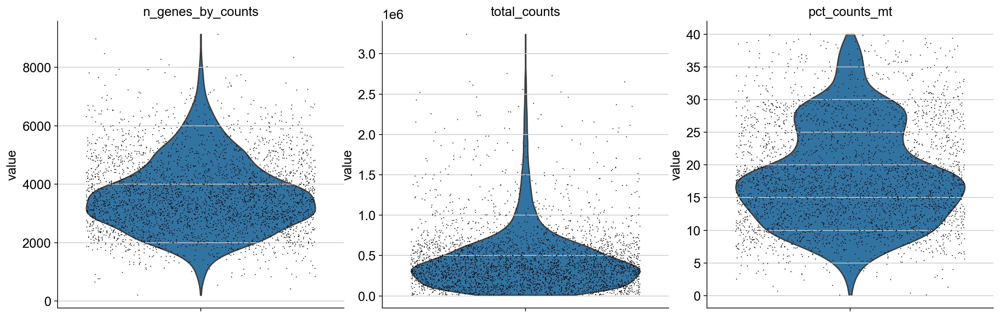

In [40]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

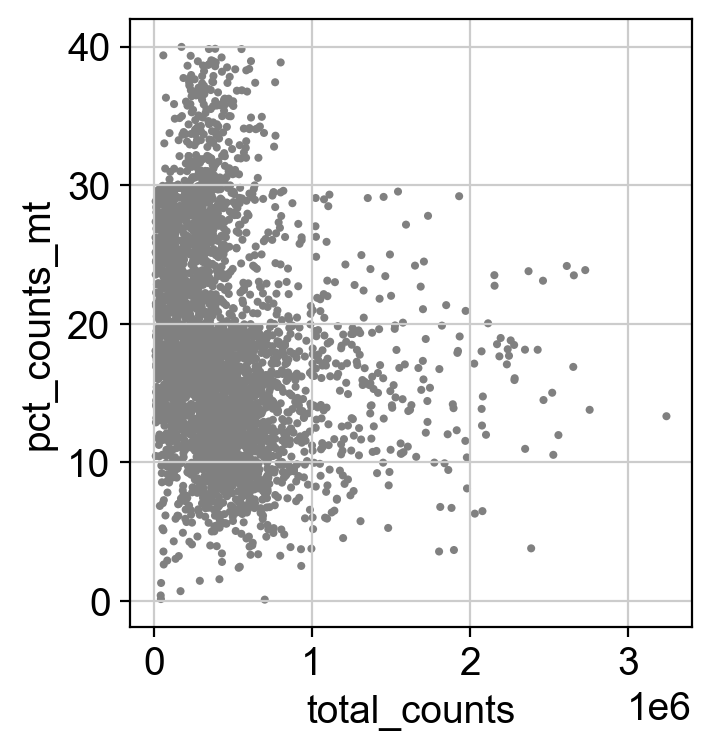

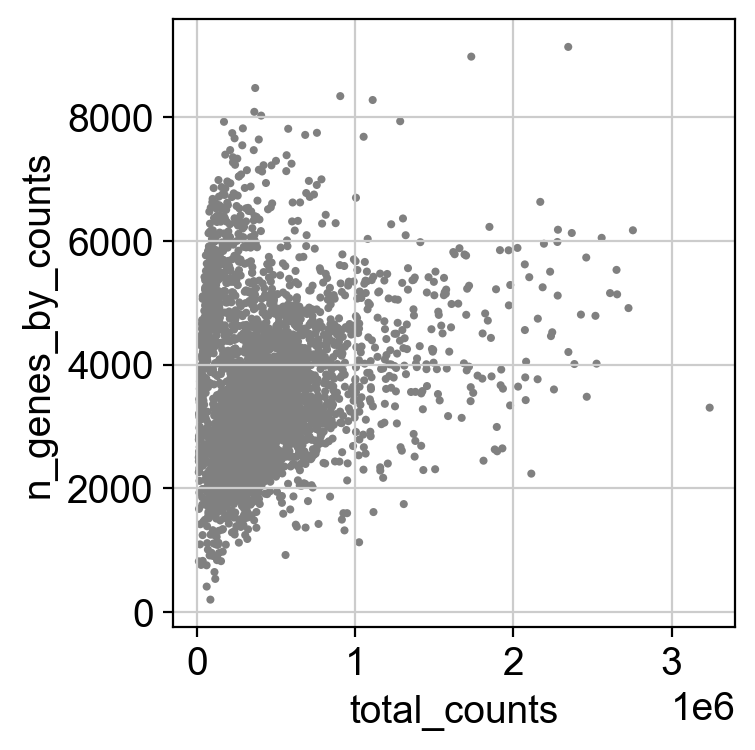

In [41]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [42]:
print(adata.obs.shape)
#adata = adata[adata.obs.pct_counts_mt < 20, :]
print(adata.obs.shape)

(3547, 11)
(3547, 11)


# Normalize and logartithmize the data

In [43]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [44]:
sc.pp.log1p(adata)

## Identify highly variable genes

In [45]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


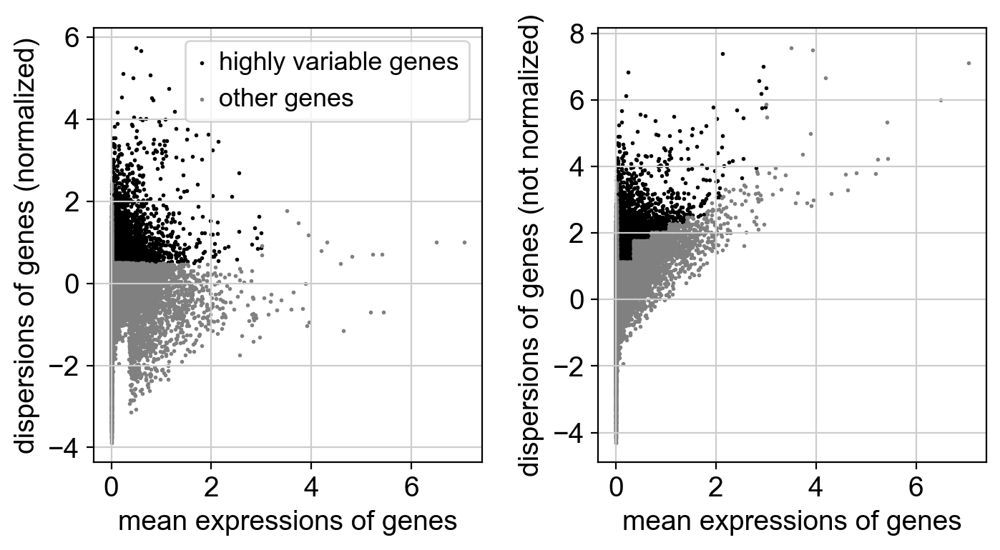

In [46]:
sc.pl.highly_variable_genes(adata)

In [47]:
adata.raw = adata

In [48]:
adata = adata[:, adata.var.highly_variable]

In [49]:
# Make metadata categorical to use for regression
adata.obs['Gender'] = adata.obs['Gender'].astype('category')
adata.obs['Age_bin'] = adata.obs['Age_bin'].astype('category')
adata.obs['Dataset'] = adata.obs['Dataset'].astype('category')

Trying to set attribute `.obs` of view, copying.


In [50]:
sc.pp.regress_out(adata, ['total_counts'])
sc.pp.regress_out(adata, ['pct_counts_mt'])
#sc.pp.regress_out(adata, ['Gender'])
#sc.pp.regress_out(adata, ['Age_bin'])
sc.pp.regress_out(adata, ['Dataset'])

regressing out ['total_counts']
    finished (0:00:13)
regressing out ['pct_counts_mt']
    finished (0:00:13)
regressing out ['Dataset']
    finished (0:00:14)


In [51]:
sc.pp.scale(adata, max_value=10)

## Principal component analysis

In [52]:
adata_beforepca = adata

In [53]:
adata = adata_beforepca

In [54]:
adata.uns

OverloadedDict, wrapping:
	{'log1p': {'base': None}, 'hvg': {'flavor': 'seurat'}}
With overloaded keys:
	['neighbors'].

In [55]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


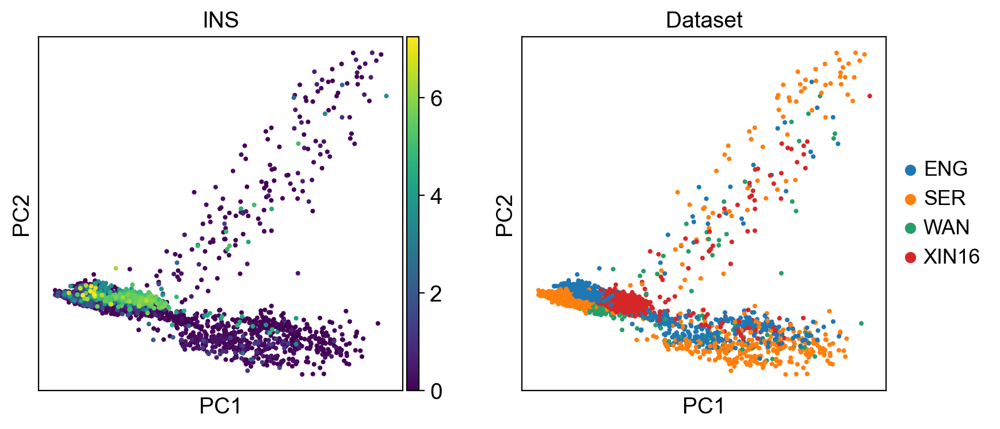

In [56]:
#  Generated PCA scatterplot
sc.pl.pca(adata, color=['INS', 'Dataset'])

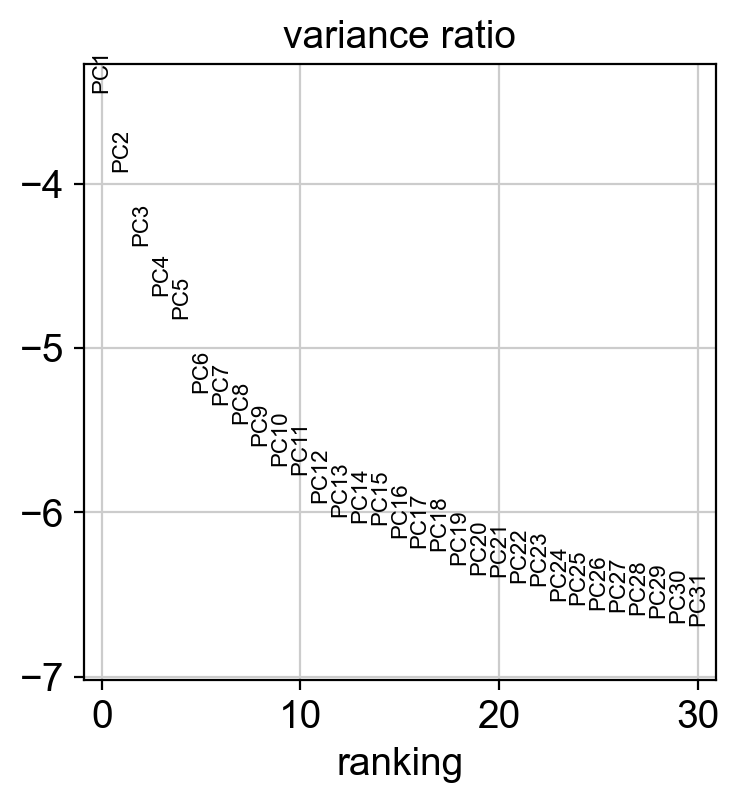

In [57]:
sc.pl.pca_variance_ratio(adata, log=True)

In [62]:
# save data before kNN
adata_beforekNN = adata

In [63]:
adata = adata_beforekNN

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


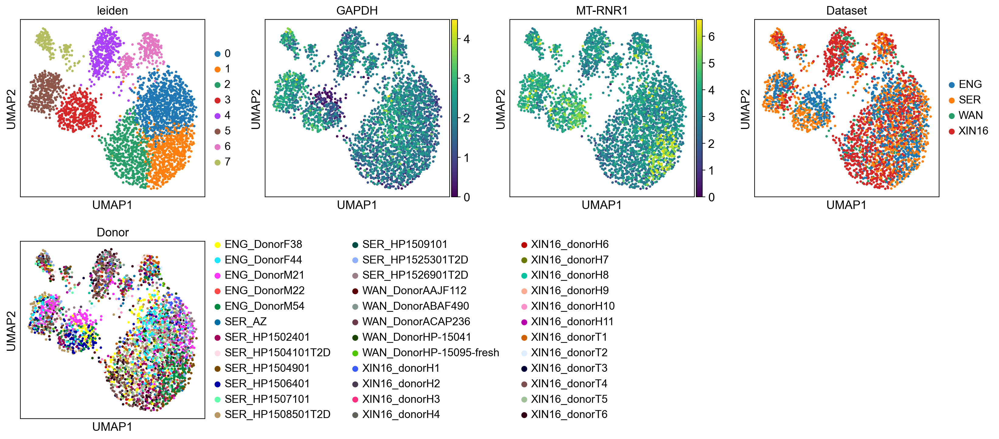

In [64]:
sc.external.pp.bbknn(adata, batch_key='Donor', n_pcs=31, metric='euclidian') # before n_trees and metric not selected
sc.tl.leiden(adata)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['leiden', 'GAPDH', 'MT-RNR1', 'Dataset', 'Donor'])


## Nearest neigbour distances
We look at the distance between the nearest neighbour for each cell. The number of neighbours is a fixed number (k), when the distance becomes too large this can mean that we deal with outlier cells. We check the smallest distance for each cell and the largest, we then set a treshold and remove the cells with a distance that seem to large. 

In [65]:
# distance
dist_df = pd.DataFrame.sparse.from_spmatrix(adata.obsp['distances'])


In [66]:
dist_df

,0,1,2,3,4,5,6,7,8,9,...,3537,3538,3539,3540,3541,3542,3543,3544,3545,3546
0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,1.171533,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3542,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
3543,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
3544,0.0,0.0,0.0,0.0,0.0,0.581086,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
3545,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.732419,0.0,0.0


In [67]:
maxd = dist_df.max(axis=1)
mind = dist_df[dist_df>0].min(axis=1)

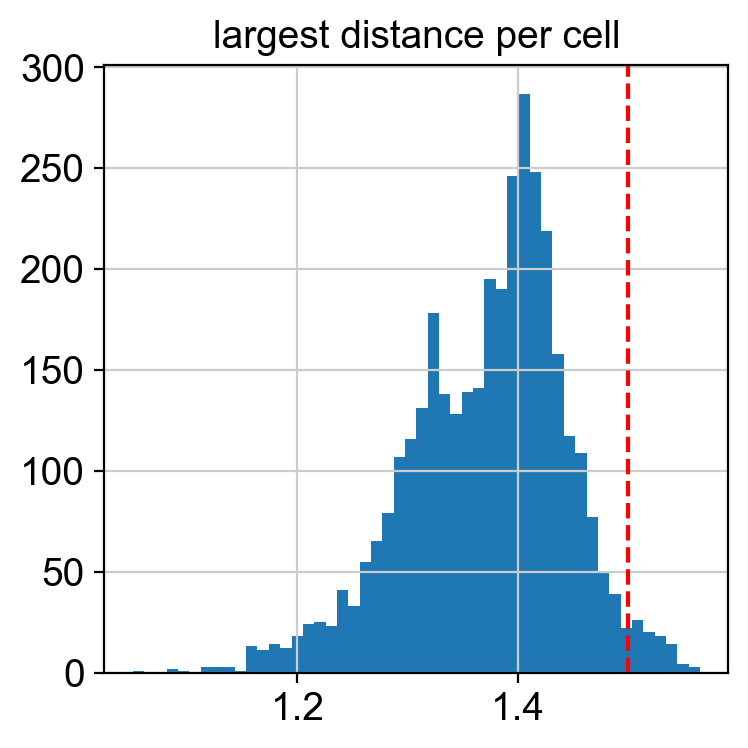

In [97]:
plt.hist(maxd, bins=50)
plt.title('largest distance per cell')
plt.axvline(x=1.5, ls='--', color='red');

In [69]:
(dist_df>0).sum(axis=1)

0       107
1       107
2       107
3       107
4       107
       ... 
3542    107
3543    107
3544    107
3545    107
3546    107
Length: 3547, dtype: int64

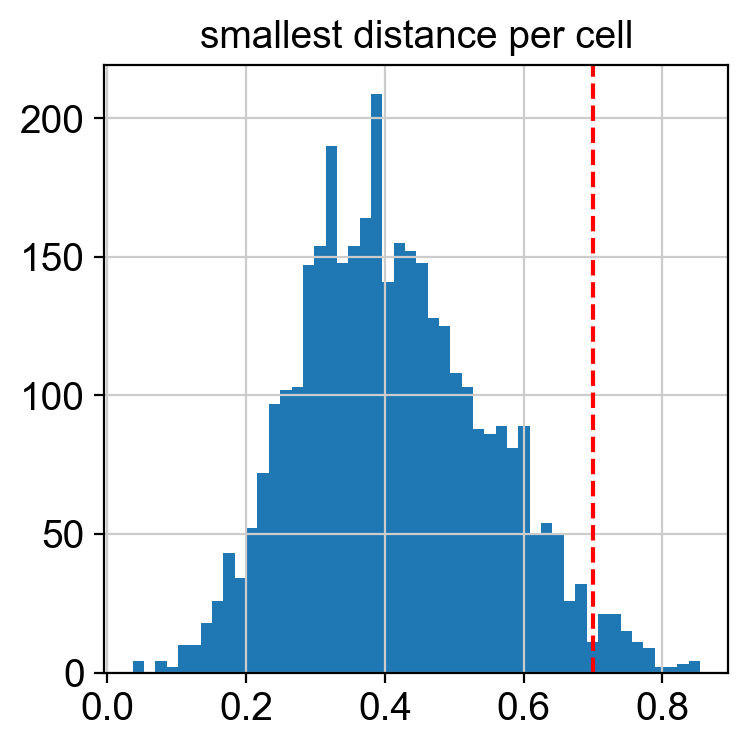

In [98]:
plt.hist(mind, bins=50)
plt.title('smallest distance per cell')
plt.axvline(x=0.7, ls='--', color='red')

In [71]:
adata.obs['1-NN'] = [i for i in mind]
adata.obs['last-NN'] = [i for i in maxd]

In [72]:
adata.obs

,Donor,Dataset,Group,Gender,Age,Age_bin,BMI,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,1-NN,last-NN
SER_HP1508501T2D_A10,SER_HP1508501T2D,SER,T2D,Female,37,Middle_aged,"39,6",3285,33419.0,9240.0,27.648943,4,0.378161,1.435758
SER_HP1508501T2D_A11,SER_HP1508501T2D,SER,T2D,Female,37,Middle_aged,"39,6",4946,135695.0,24298.0,17.906334,3,0.236116,1.454701
SER_HP1508501T2D_A12,SER_HP1508501T2D,SER,T2D,Female,37,Middle_aged,"39,6",5947,343566.0,66324.0,19.304588,0,0.295681,1.400119
SER_HP1508501T2D_A13,SER_HP1508501T2D,SER,T2D,Female,37,Middle_aged,"39,6",3975,266204.0,53534.0,20.110140,1,0.370248,1.355076
SER_HP1508501T2D_A14,SER_HP1508501T2D,SER,T2D,Female,37,Middle_aged,"39,6",4815,199193.0,40640.0,20.402323,0,0.356454,1.366736
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENG_DonorF44_Cell_93,ENG_DonorF44,ENG,healthy,Female,44,Middle_aged,nan,2408,435211.0,55454.0,12.741865,2,0.562008,1.326310
ENG_DonorF44_Cell_94,ENG_DonorF44,ENG,healthy,Female,44,Middle_aged,nan,3265,314405.0,57547.0,18.303461,0,0.366153,1.470556
ENG_DonorF44_Cell_95,ENG_DonorF44,ENG,healthy,Female,44,Middle_aged,nan,2819,256534.0,47758.0,18.616636,0,0.497866,1.329418
ENG_DonorF44_Cell_97,ENG_DonorF44,ENG,healthy,Female,44,Middle_aged,nan,1919,309475.0,46385.0,14.988287,2,0.732419,1.313151


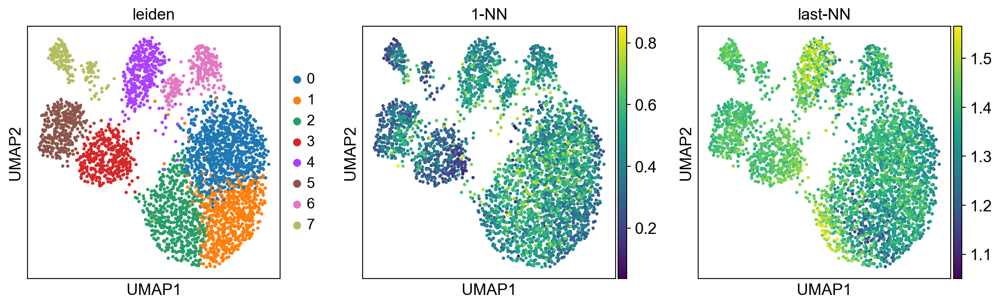

In [73]:
sc.pl.umap(adata, color=['leiden', '1-NN', 'last-NN'])

Text(0, 0.5, 'distance first NN')

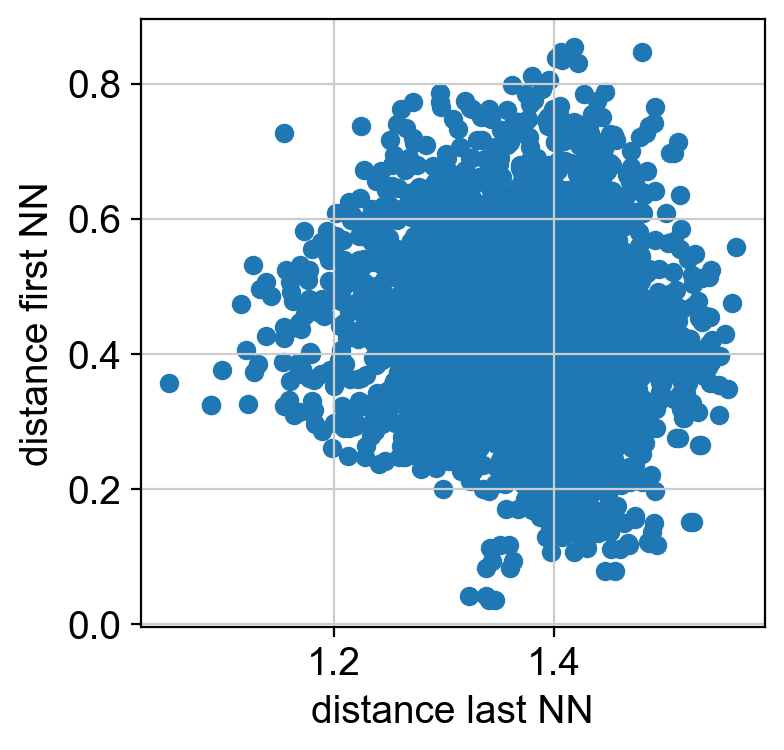

In [75]:
x = adata.obs.loc[:,['last-NN']]
y = adata.obs.loc[:,['1-NN']]


plt.scatter(x,y)
plt.xlabel('distance last NN')
plt.ylabel('distance first NN')

In [85]:
adata.obs['NN'] = ['Outlier distance' if adata.obs.loc[i,'last-NN'] > 1.5 or adata.obs.loc[i,'1-NN'] > 0.7 else 'Normal distance' for i in adata.obs.index]

... storing 'NN' as categorical


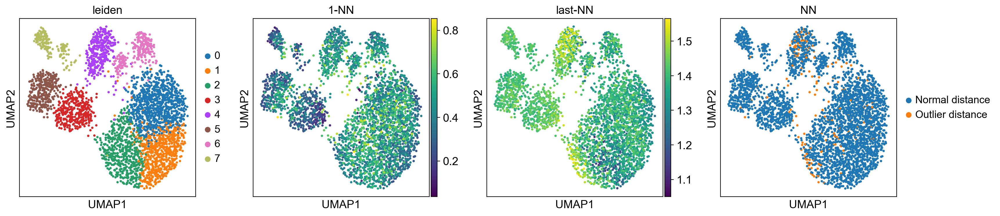

In [86]:
sc.pl.umap(adata, color=['leiden','1-NN', 'last-NN', 'NN'])

In [102]:
adataf = adata_beforepca

In [103]:
filter_cells = adata.obs[(adata.obs['NN'] == 'Normal distance') & (adata.obs['Dataset'] != 'BAR')].index

In [104]:
adataf = adataf[filter_cells,:]


In [105]:
len(adataf.obs.index), len(adata.obs.index), len(adata.obs.index) - len(adataf.obs.index)

(3367, 3547, 180)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


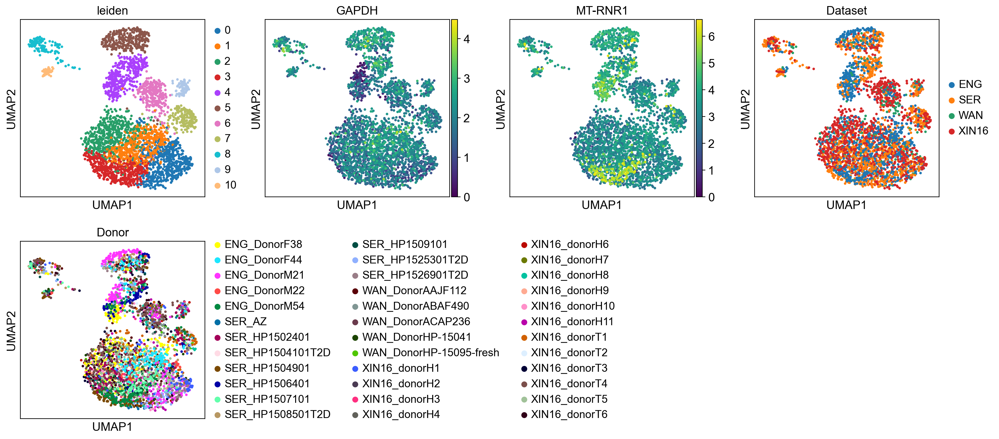

In [106]:
sc.tl.pca(adataf, svd_solver='arpack')
sc.external.pp.bbknn(adataf, batch_key='Dataset', n_pcs=30, metric='euclidian') # before n_trees and metric not selected
sc.tl.leiden(adataf)
sc.tl.umap(adataf)
sc.pl.umap(adataf, color=['leiden', 'GAPDH', 'MT-RNR1', 'Dataset', 'Donor'])

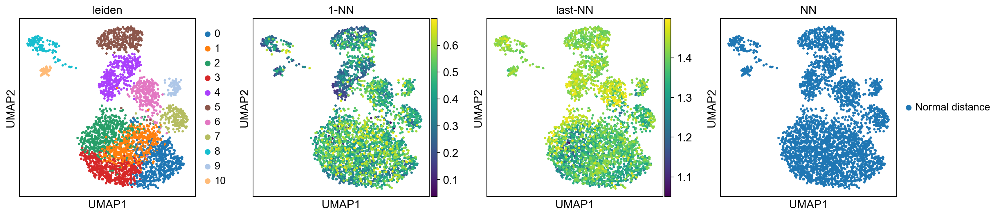

In [107]:
sc.pl.umap(adataf, color=['leiden','1-NN', 'last-NN', 'NN'])

UMAPs to check mixing of cell types according to different characteristics

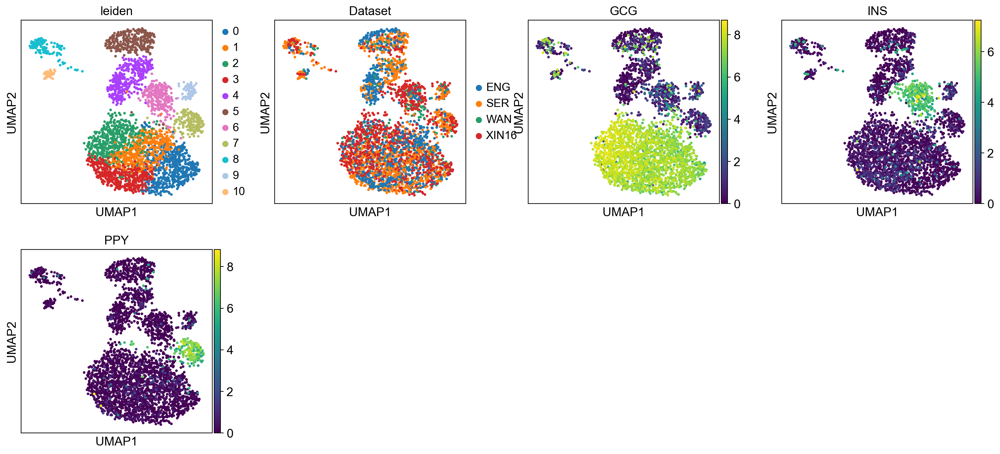

In [108]:
sc.pl.umap(adataf, color=['leiden', 'Dataset','Gender', 'Age_bin', 'Group'])

## Cell type annotation
Cell type annotation using common marker genes of pancreas cell types

In [101]:
sc.pl.umap(adata, color=['CHGA', 'INS', 'CD59', 'NKX6-1', 'GCG', 'IRX2', 'SST', 'GHRL', 
                         'HHEX', 'PPY', 'PTF1A', 'CPA1','KRT19', 'SOX9', 'CFTR' , 'ACTA2', 'VIM', 
                         'COL1A1', 'PECAM1', 'VWF', 'CD93', 'CD53'])

In [ ]:
# Assign clusters
Clusters = {'0': 'α-cells', '1': 'α-cells', '2': 'α-cells', '3': 'α-cells', '4': 'Acinar cells', '5': 'Ductal cells', '6': 'β-cells', 
           '7': 'PP-cells', '8': 'Stellate cells', '9': 'σ-cells', '10': 'Endothelial cells'}

CellType = {'0': 'alpha-cells', '1': 'alpha-cells', '2': 'alpha-cells', '3': 'alpha-cells', '4': 'acinar-cells', '5': 'ductal-cells', '6': 'beta-cells', 
           '7': 'PP-cells', '8': 'stellate-cells', '9': 'delta-cells', '10': 'endothelial-cells'}

adata.obs['Cluster'] = [Clusters[idx] for idx in adata.obs['leiden']]
adata.obs['Cell_type'] = [CellType[idx] for idx in adata.obs['leiden']]

In [ ]:
sc.pl.umap(adata, color=['Cluster'], legend_loc='on data', title='cell type clusters')

## Save the data
Save the anndata object into h5ad format

In [ ]:
adata.write('../3UTRpancreas_apoL_project.h5ad')